In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [13]:
data = pd.read_csv('../data/final2_merged_drought_temp.csv')

In [14]:
data.head()

,ValidEnd,Name,state,area_none,area_d0,area_d1,area_d2,area_d3,area_d4,population_none,...,population_d4,DSCI,total_area,total_population,climate_regions,avg_tmax,avg_tmin,total_avg_prcp_inches,temp_id,total_avg_prcp_mm
0,2021-01-04,Alabama,AL,47712.19,3892.15,0.0,0.0,0.0,0.0,4596699.61,...,0.0,8,51604.34,4779736.02,Southeast,67.940000,41.450000,0.000,Colorado,0.0000
1,2020-12-28,Alabama,AL,39068.95,12535.39,0.0,0.0,0.0,0.0,4038013.82,...,0.0,24,51604.34,4779736.02,Southeast,57.797143,30.522857,1.440,98,36.5760
2,2020-12-21,Alabama,AL,39068.95,12535.40,0.0,0.0,0.0,0.0,4038013.43,...,0.0,24,51604.35,4779736.02,Southeast,53.634286,34.314286,0.354,98,8.9916
3,2020-12-14,Alabama,AL,42812.87,8791.48,0.0,0.0,0.0,0.0,4239664.15,...,0.0,17,51604.35,4779736.02,Southeast,64.145714,38.808571,1.236,98,31.3944
4,2020-12-07,Alabama,AL,45608.51,5995.84,0.0,0.0,0.0,0.0,4483976.48,...,0.0,12,51604.35,4779736.02,Southeast,55.377143,31.965714,0.852,98,21.6408


In [15]:
#dropping december week
indexNames = data[ data['ValidEnd'] == '2021-01-04' ].index
data.drop(indexNames , inplace=True)


In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46980 entries, 1 to 47024
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ValidEnd               46980 non-null  object 
 1   Name                   46980 non-null  object 
 2   state                  46980 non-null  object 
 3   area_none              46980 non-null  float64
 4   area_d0                46980 non-null  float64
 5   area_d1                46980 non-null  float64
 6   area_d2                46980 non-null  float64
 7   area_d3                46980 non-null  float64
 8   area_d4                46980 non-null  float64
 9   population_none        46980 non-null  float64
 10  population_d0          46980 non-null  float64
 11  population_d1          46980 non-null  float64
 12  population_d2          46980 non-null  float64
 13  population_d3          46980 non-null  float64
 14  population_d4          46980 non-null  float64
 15  DS

In [17]:
data.shape

(46980, 24)

In [18]:
#change the format of the time of the regions
data['ValidEnd']= pd.to_datetime(data['ValidEnd'])
data['ValidEnd'] = data['ValidEnd'].dt.strftime('%m/%d/%Y')
data['ValidEnd']=data['ValidEnd'].astype('datetime64[ns]')

## graphics of the Climate regions 

In [19]:
data.groupby(data['climate_regions'])['DSCI'].mean()

climate_regions
Northeast                       36.195163
Northern Rockies and Plains    105.121073
Northwest                      111.024904
Ohio Valley                     36.665572
South                           85.607120
Southeast                       78.231960
Southwest                      162.314416
Upper Midwest                   49.033285
West                           166.890805
Name: DSCI, dtype: float64

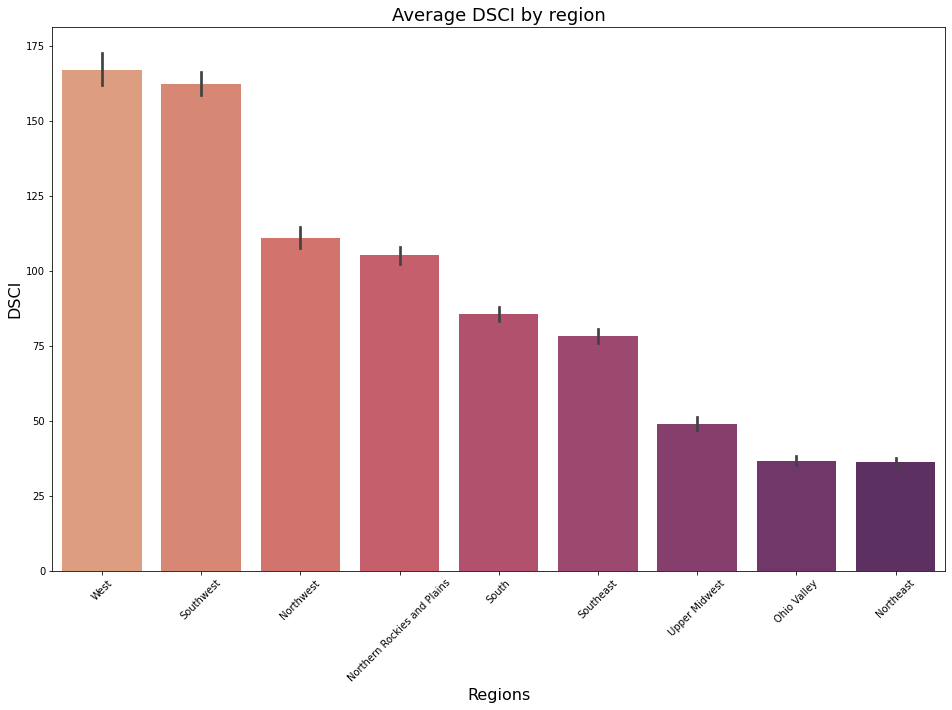

In [20]:
order= data.groupby(data['climate_regions'])['DSCI'].mean().sort_values().iloc[::-1].index
fig, ax = plt.subplots(figsize=(16, 10))
sns.barplot(x='climate_regions',
    y='DSCI',
    data=data,order=order,palette="flare");
plt.title('Average DSCI by region',fontdict={'fontsize':18});
plt.xlabel('Regions',fontdict={'fontsize':16});
plt.ylabel('DSCI',fontdict={'fontsize':16});
plt.xticks(rotation=45)
plt.savefig('../images/Average_DSCI_of_20.png')

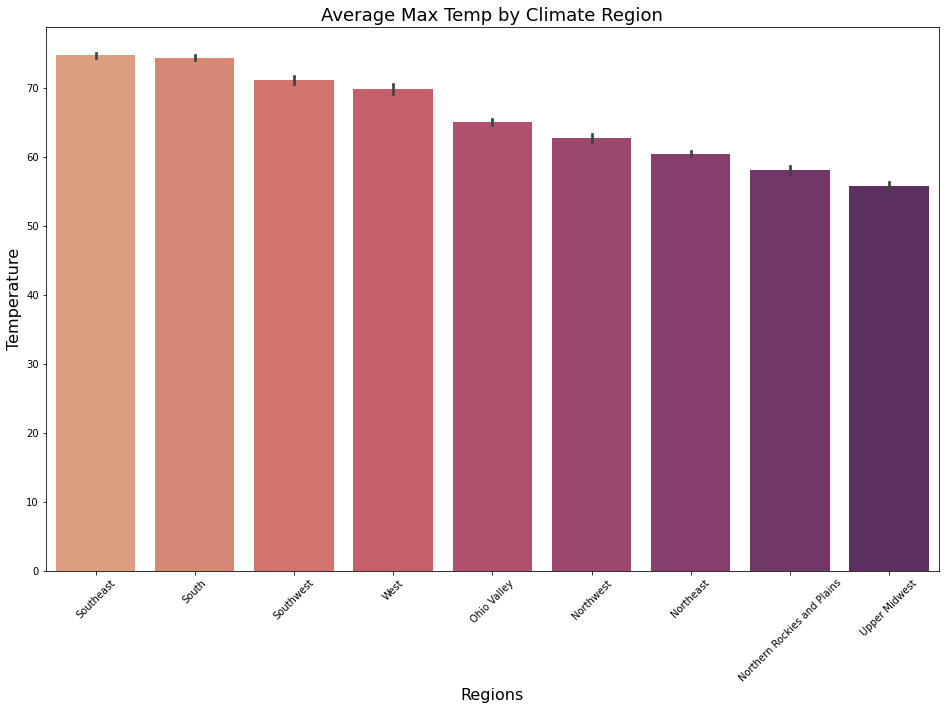

In [21]:
order= data.groupby(data['climate_regions'])['avg_tmax'].mean().sort_values().iloc[::-1].index
fig, ax = plt.subplots(figsize=(16, 10))
sns.barplot(x='climate_regions',
    y='avg_tmax',
    data=data,order=order,palette="flare");
plt.title('Average Max Temp by Climate Region',fontdict={'fontsize':18});
plt.xlabel('Regions',fontdict={'fontsize':16});
plt.ylabel('Temperature',fontdict={'fontsize':16});
plt.xticks(rotation=45)
plt.savefig('../images/Average_temperature_of_20.png')

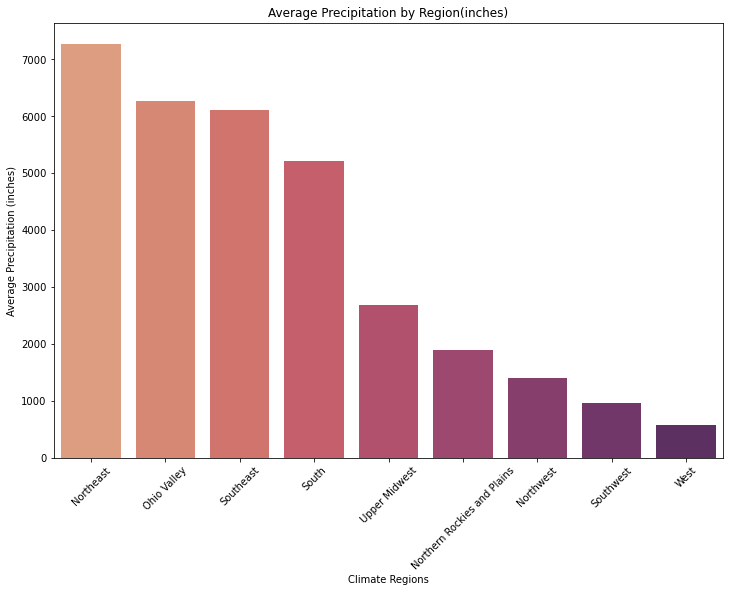

In [22]:

order= data.groupby(data['climate_regions'])['total_avg_prcp_inches'].sum()
order_index= data.groupby(data['climate_regions'])['total_avg_prcp_inches'].sum().sort_values().iloc[::-1].index

order=pd.DataFrame(order)
order.reset_index(inplace=True)
plt.figure(figsize=(12,8))
sns.barplot(x='climate_regions',
    y='total_avg_prcp_inches',
    data=order,order=order_index,palette="flare");
plt.title('Average Precipitation by Region(inches)',fontdict={'fontsize':12});
plt.xlabel('Climate Regions',fontdict={'fontsize':10});
plt.xticks(rotation=45)
plt.ylabel('Average Precipitation (inches)',fontdict={'fontsize':10})
plt.savefig('../images/average_prec.png')

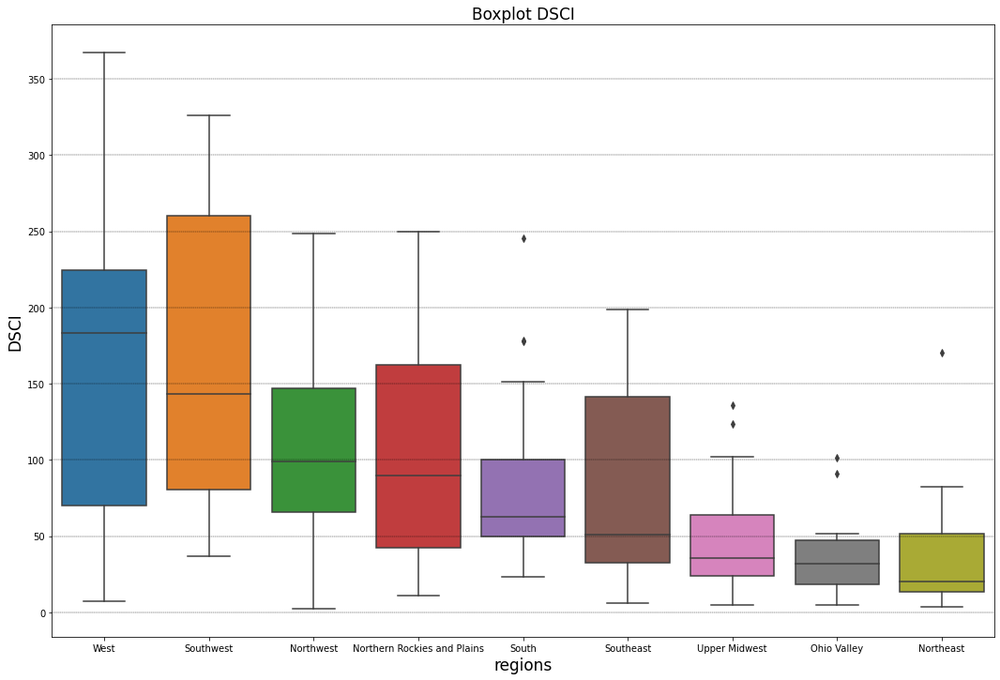

In [23]:
#graph the DCSI of the regions
df_regions_years=data.groupby(by=[data['ValidEnd'].dt.year,data['climate_regions']])['DSCI'].agg([ 'mean'])
df_regions_years.reset_index(inplace=True)
order= df_regions_years.groupby(df_regions_years['climate_regions'])['mean'].mean().sort_values().iloc[::-1].index

plt.figure(figsize=(18, 12))
sns.boxplot(x='climate_regions',
    y='mean',
    data=df_regions_years,order=order)

plt.title('Boxplot DSCI',fontdict={'fontsize':17});
plt.xlabel('regions',fontdict={'fontsize':17});
plt.ylabel('DSCI',fontdict={'fontsize':17});
plt.grid(axis = 'y',color = 'black', linestyle = '--', linewidth = 0.4)
plt.savefig('../images/boxplot_DSCI.png')

## graphics of Time serie of the Climate regions 

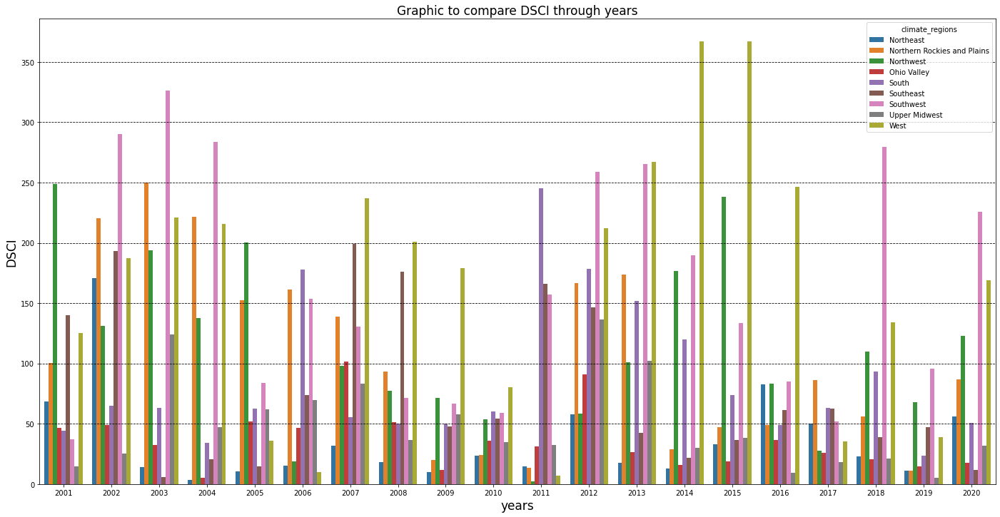

In [24]:
#graph the DCSI of the regions
plt.figure(figsize=(24, 12))
sns.barplot(x='ValidEnd',
    y='mean',
    hue='climate_regions',
    data=df_regions_years)
plt.title('Graphic to compare DSCI through years',fontdict={'fontsize':17});
plt.xlabel('years',fontdict={'fontsize':17});
plt.ylabel('DSCI',fontdict={'fontsize':17});
plt.grid(axis = 'y',color = 'black', linestyle = '--', linewidth = 0.8)
plt.savefig('../images/dsci_regions.png')

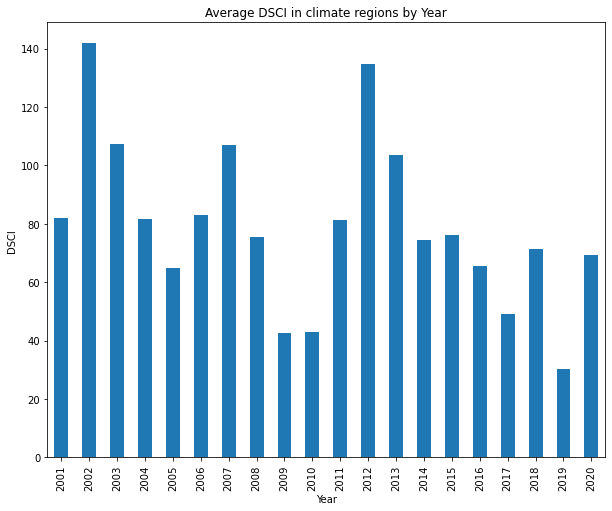

In [25]:
years_DSCI = data.groupby(data['ValidEnd'].dt.year)['DSCI'].mean()
years_DSCI.plot(kind = 'bar', figsize = (10, 8))
plt.xlabel("Year")
plt.ylabel("DSCI")
plt.title(f'Average DSCI in climate regions by Year');
plt.savefig('../images/Average_DSCI_by years.png')

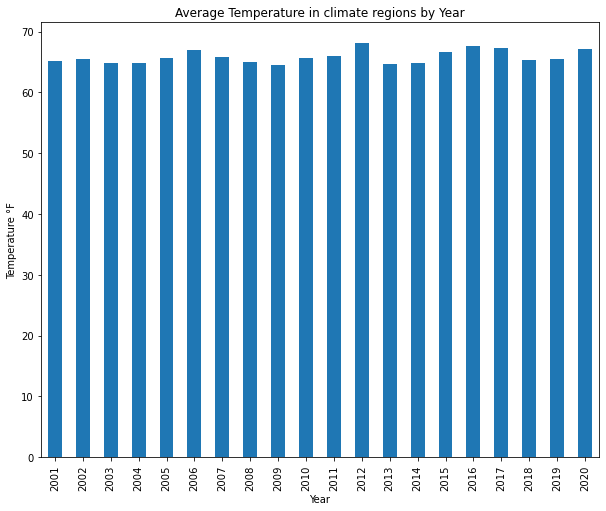

In [27]:
years_temp = data.groupby(data['ValidEnd'].dt.year)['avg_tmax'].mean()
years_temp.plot(kind = 'bar', figsize = (10, 8))
plt.xlabel("Year")
plt.ylabel("Temperature °F")
plt.title(f'Average Temperature in climate regions by Year');
plt.savefig('../images/Average_temp_by_years.png')

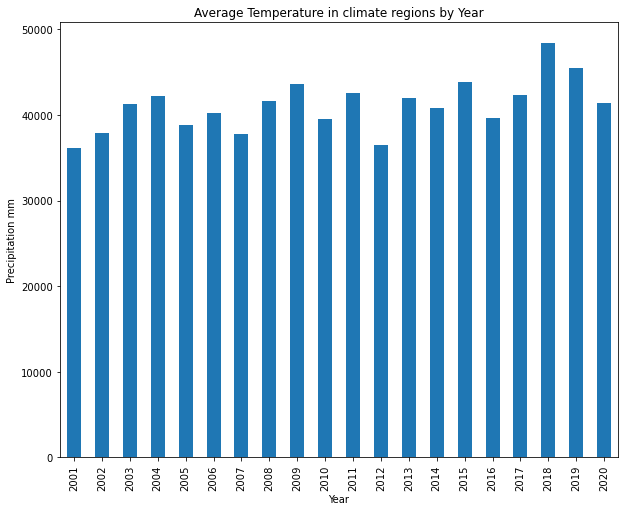

In [28]:
years_temp = data.groupby(data['ValidEnd'].dt.year)['total_avg_prcp_mm'].sum()
years_temp.plot(kind = 'bar', figsize = (10, 8))
plt.xlabel("Year")
plt.ylabel("Precipitation mm")
plt.title(f'Average Temperature in climate regions by Year');
plt.savefig('../images/Average_prec_by_years.png')

In [29]:
southwest=data[data['climate_regions']=='Southwest']
west=data[data['climate_regions']=='West']
nrp=data[data['climate_regions']=='Northern Rockies and Plains']
northwest=data[data['climate_regions']=='Northwest']

southwest.set_index('ValidEnd',inplace=True)
west.set_index('ValidEnd',inplace=True)
nrp.set_index('ValidEnd',inplace=True)
northwest.set_index('ValidEnd',inplace=True)

In [30]:
southwest_df=southwest.groupby('ValidEnd').agg({'area_none':'sum','area_d0':'sum','area_d1':'sum','area_d2':'sum','area_d3':'sum','area_d4':'sum',
                                                  'population_none':'sum','population_d0':'sum','population_d1':'sum','population_d2':'sum','population_d3':'sum',
                                                  'population_d4':'sum','DSCI':'mean','total_population':'sum','total_area':'sum','avg_tmax':'mean','total_avg_prcp_mm':'sum'})

west_df=west.groupby('ValidEnd').agg({'area_none':'sum','area_d0':'sum','area_d1':'sum','area_d2':'sum','area_d3':'sum','area_d4':'sum',
                                                  'population_none':'sum','population_d0':'sum','population_d1':'sum','population_d2':'sum','population_d3':'sum',
                                                  'population_d4':'sum','DSCI':'mean','total_population':'sum','total_area':'sum','avg_tmax':'mean','total_avg_prcp_mm':'sum'})

nrp_df=nrp.groupby('ValidEnd').agg({'area_none':'sum','area_d0':'sum','area_d1':'sum','area_d2':'sum','area_d3':'sum','area_d4':'sum',
                                                  'population_none':'sum','population_d0':'sum','population_d1':'sum','population_d2':'sum','population_d3':'sum',
                                                  'population_d4':'sum','DSCI':'mean','total_population':'sum','total_area':'sum','avg_tmax':'mean','total_avg_prcp_mm':'sum'})

northwest_df=northwest.groupby('ValidEnd').agg({'area_none':'sum','area_d0':'sum','area_d1':'sum','area_d2':'sum','area_d3':'sum','area_d4':'sum',
                                                  'population_none':'sum','population_d0':'sum','population_d1':'sum','population_d2':'sum','population_d3':'sum',
                                                  'population_d4':'sum','DSCI':'mean','total_population':'sum','total_area':'sum','avg_tmax':'mean','total_avg_prcp_mm':'sum'})

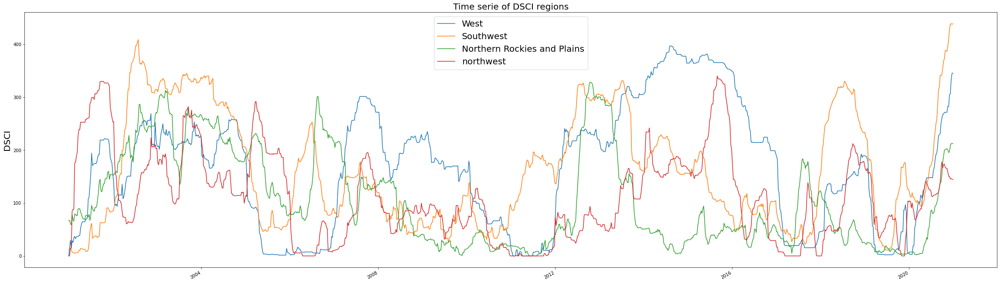

In [31]:
fig, ax = plt.subplots(figsize=(40, 12))

ax.plot(west_df['DSCI'])
ax.plot(southwest_df['DSCI'])
ax.plot(nrp_df['DSCI'])
ax.plot(northwest_df['DSCI'])

plt.title('Time serie of DSCI regions',fontdict={'fontsize':20});
plt.ylabel("DSCI",fontdict={'fontsize':20})
plt.legend(['West','Southwest','Northern Rockies and Plains','northwest'],loc='upper center',fontsize=20);
fig.autofmt_xdate()
plt.savefig('../images/time_serie_3_drought_regions.png')

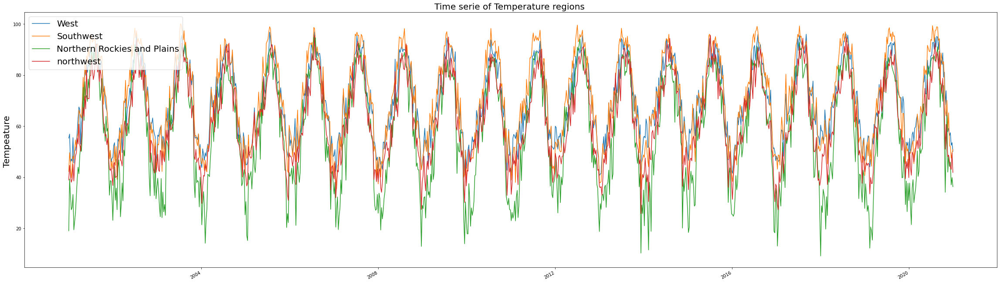

In [32]:
fig, ax = plt.subplots(figsize=(40,12))

ax.plot(west_df['avg_tmax'])
ax.plot(southwest_df['avg_tmax'])
ax.plot(nrp_df['avg_tmax'])
ax.plot(northwest_df['avg_tmax'])

plt.title('Time serie of Temperature regions ',fontdict={'fontsize':20});
plt.ylabel("Tempeature ",fontdict={'fontsize':20})
plt.legend(['West','Southwest','Northern Rockies and Plains','northwest'],loc='upper left',fontsize=20);
fig.autofmt_xdate()
plt.savefig('../images/time_serie_temp_3_regions.png')

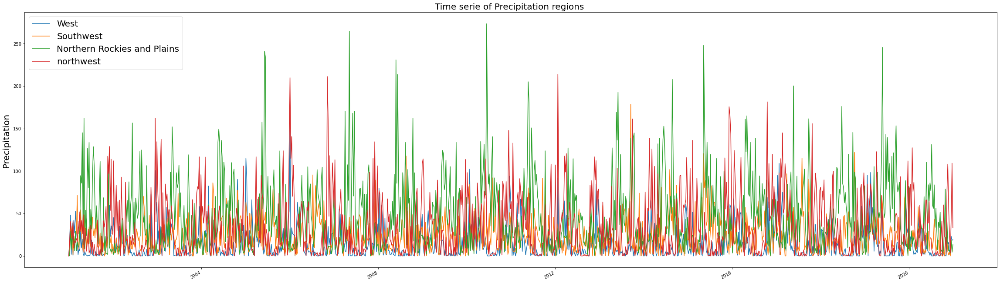

In [33]:
fig, ax = plt.subplots(figsize=(40, 12))

ax.plot(west_df['total_avg_prcp_mm'])
ax.plot(southwest_df['total_avg_prcp_mm'])
ax.plot(nrp_df['total_avg_prcp_mm'])
ax.plot(northwest_df['total_avg_prcp_mm'])

plt.title('Time serie of Precipitation regions ',fontdict={'fontsize':20});
plt.ylabel("Precipitation ",fontdict={'fontsize':20})
plt.legend(['West','Southwest','Northern Rockies and Plains','northwest'],loc='upper left',fontsize=20);
fig.autofmt_xdate()
plt.savefig('../images/time_serie_3_prec_regions.png')

### West Analysis

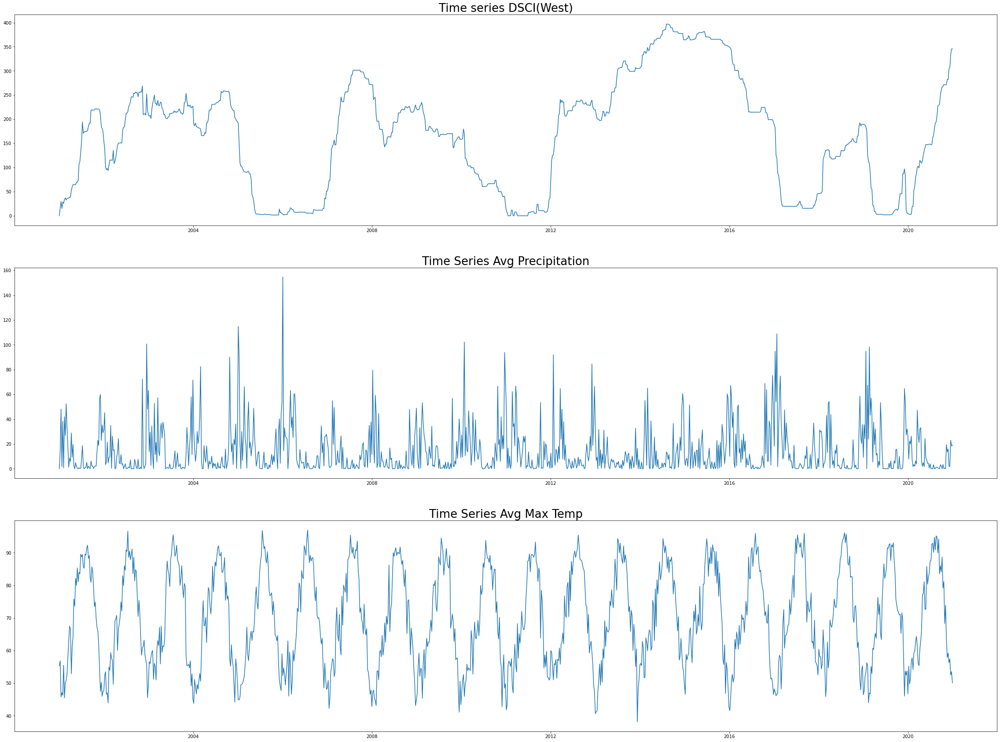

In [34]:
fig, (ax1,ax2,ax3) = plt.subplots(3,figsize=(40, 30))
ax1.plot(west_df['DSCI'])
ax1.set_title('Time series DSCI(West)',fontdict={'fontsize':26});
ax2.plot(west_df['total_avg_prcp_mm'],)
ax2.set_title('Time Series Avg Precipitation',fontdict={'fontsize':26});
ax3.plot(west_df['avg_tmax'])
ax3.set_title('Time Series Avg Max Temp',fontdict={'fontsize':26});
plt.savefig('../images/west_3 graphs.png')

### Southwest Analysis

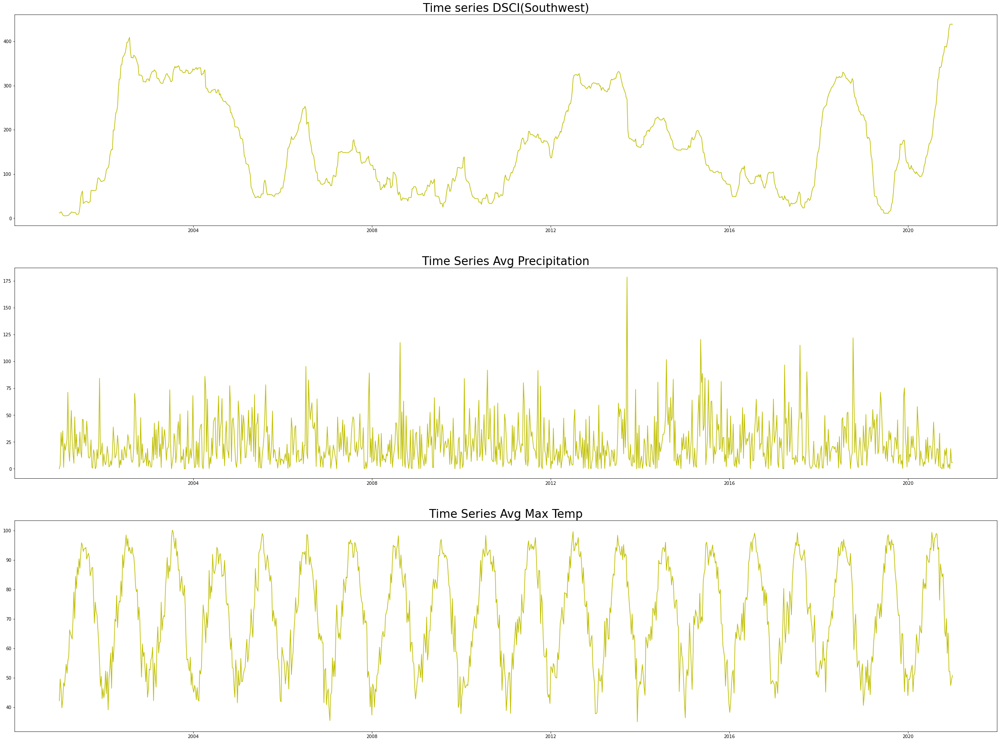

In [35]:
fig, (ax1,ax2,ax3) = plt.subplots(3,figsize=(40, 30))
ax1.plot(southwest_df['DSCI'],color='y')
ax1.set_title('Time series DSCI(Southwest)',fontdict={'fontsize':26});
ax2.plot(southwest_df['total_avg_prcp_mm'],color='y')
ax2.set_title('Time Series Avg Precipitation',fontdict={'fontsize':26});
ax3.plot(southwest_df['avg_tmax'],color='y')
ax3.set_title('Time Series Avg Max Temp',fontdict={'fontsize':26});
plt.savefig('../images/southwest_3 graphs.png')

### Northern Rockies and Plains Analysis

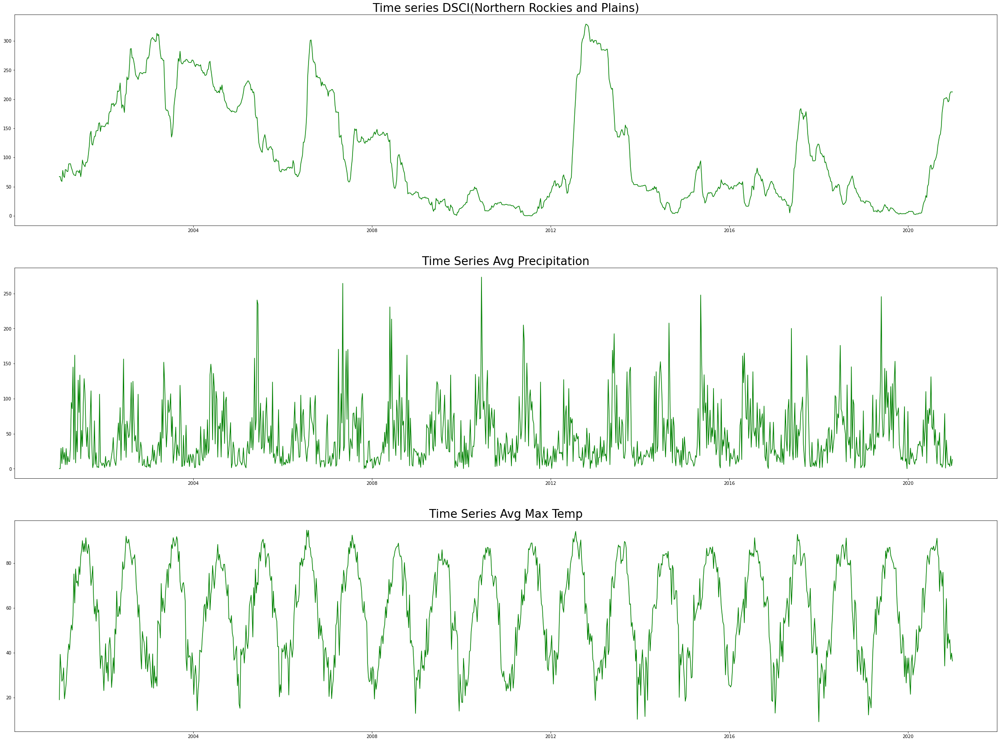

In [36]:
fig, (ax1,ax2,ax3) = plt.subplots(3,figsize=(40, 30))
ax1.plot(nrp_df['DSCI'],color='g')
ax1.set_title('Time series DSCI(Northern Rockies and Plains)',fontdict={'fontsize':26});
ax2.plot(nrp_df['total_avg_prcp_mm'],color='g')
ax2.set_title('Time Series Avg Precipitation',fontdict={'fontsize':26});
ax3.plot(nrp_df['avg_tmax'],color='g')
ax3.set_title('Time Series Avg Max Temp',fontdict={'fontsize':26});
plt.savefig('../images/norther_rockies_3 graphs.png')

### northwest Analysis

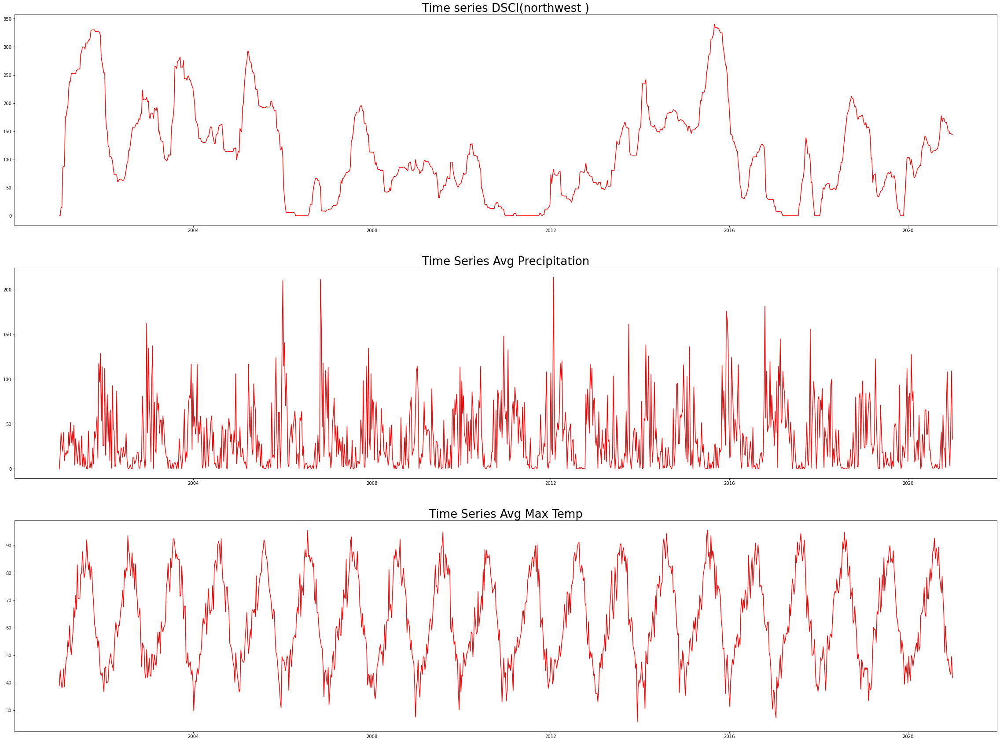

In [37]:
fig, (ax1,ax2,ax3) = plt.subplots(3,figsize=(40, 30))
ax1.plot(northwest_df['DSCI'],color='r')
ax1.set_title('Time series DSCI(northwest )',fontdict={'fontsize':26});
ax2.plot(northwest_df['total_avg_prcp_mm'],color='r')
ax2.set_title('Time Series Avg Precipitation',fontdict={'fontsize':26});
ax3.plot(northwest_df['avg_tmax'],color='r')
ax3.set_title('Time Series Avg Max Temp',fontdict={'fontsize':26});
plt.savefig('../images/northwest_3 graphs.png')

## graphics of the states 

In [38]:
data.groupby(data['state'])['DSCI'].median()

state
AL     35.0
AR     20.0
AZ    197.0
CA    140.0
CO    104.0
DE      0.0
FL     28.0
GA     60.0
IA     16.0
ID    116.0
IL      7.0
IN      0.0
KS     66.0
KY      1.0
LA     26.0
MA      0.0
MD      5.0
ME      0.0
MI     16.0
MN     30.0
MO     24.0
MS     17.0
MT     74.0
NC     37.5
ND     50.0
NE     54.0
NH      0.0
NJ      0.0
NM    145.0
NV    181.5
NY      7.0
OH      1.0
OK     74.0
OR    101.0
SC     56.0
SD     66.0
TN     11.5
TX    106.0
UT    142.5
VA     15.5
VT      0.0
WA     59.0
WI     16.0
WV      3.0
WY     90.0
Name: DSCI, dtype: float64

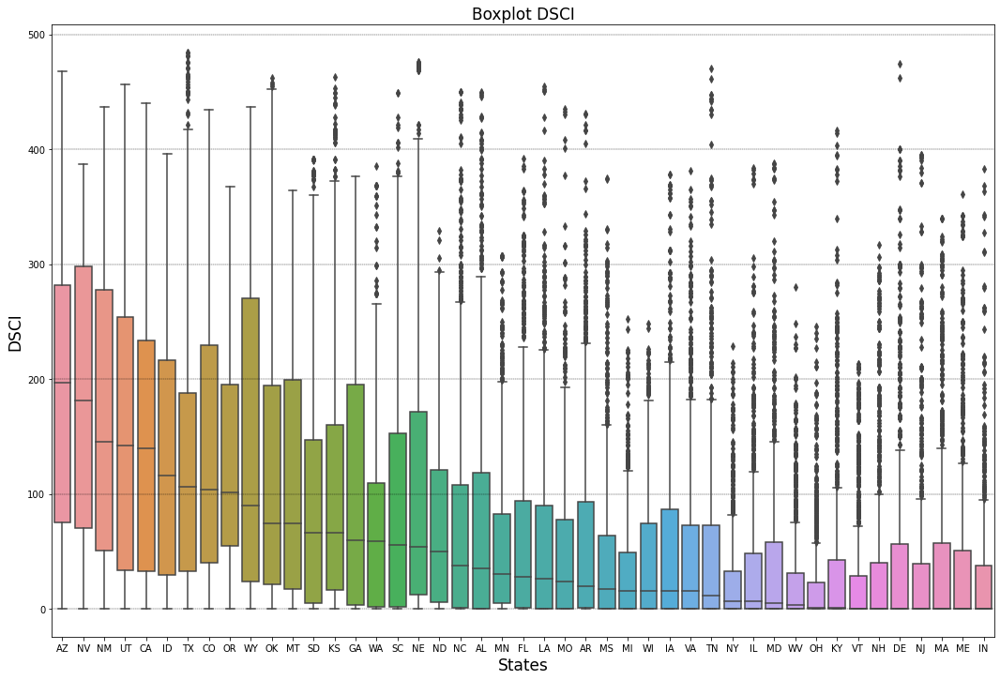

In [39]:
#graph the DCSI of the regions
my_order = data.groupby(by=['state'])['DSCI'].median().sort_values().iloc[::-1].index
plt.figure(figsize=(18, 12))
sns.boxplot(x='state',
    y='DSCI',
    data=data,order=my_order)

plt.title('Boxplot DSCI',fontdict={'fontsize':17});
plt.xlabel('States',fontdict={'fontsize':17});
plt.ylabel('DSCI',fontdict={'fontsize':17});
plt.grid(axis = 'y',color = 'black', linestyle = '--', linewidth = 0.4)
plt.savefig('../images/drought_boxplot_states.png')

### interactive graphics

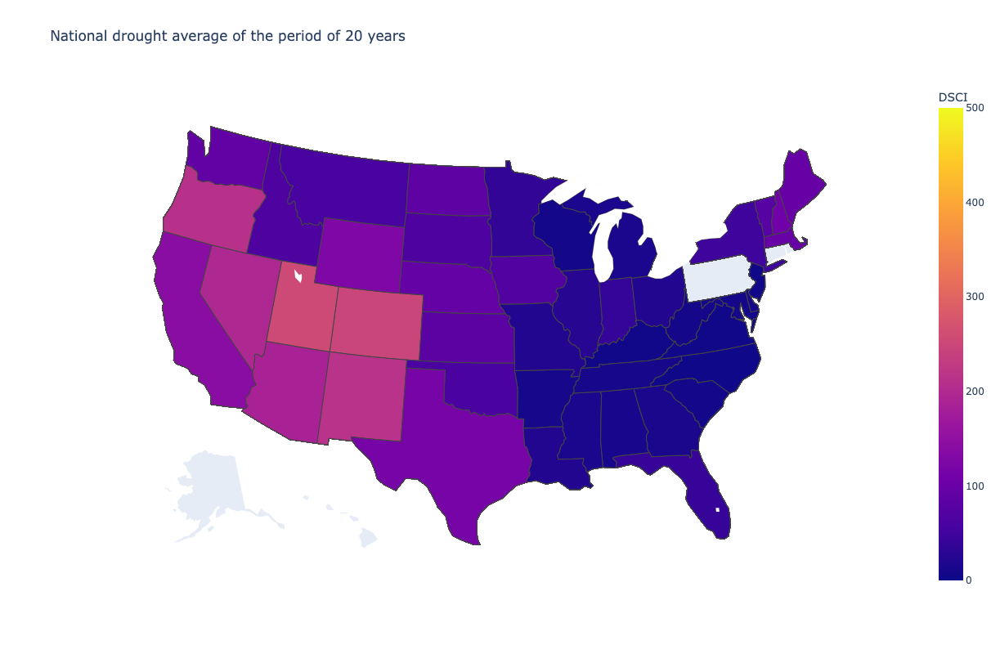

In [40]:
#Average drought throuth the years
mean_states=data.groupby(by=[data['ValidEnd'].dt.year,data['state']]).agg({'area_none':'sum','area_d0':'sum','area_d1':'sum','area_d2':'sum','area_d3':'sum','area_d4':'sum',
                                                  'population_none':'sum','population_d0':'sum','population_d1':'sum','population_d2':'sum','population_d3':'sum',
                                                  'population_d4':'sum','DSCI':'mean','total_population':'sum','total_area':'sum','avg_tmax':'mean','avg_tmin':'mean','total_avg_prcp_mm':'sum'})
mean_states.reset_index(inplace=True)
fig = px.choropleth(mean_states,locations='state',
                    locationmode='USA-states',
                    color='DSCI',hover_data=[ "avg_tmax", "total_avg_prcp_mm",'avg_tmin','area_d0','area_d1','area_d2','area_d3','area_d4'],
                    title=f'National drought average of the period of 20 years',
                    range_color=(0, 500),width=800, height=800,
                    scope='usa')
fig.show()

In [41]:
def graph_years(year):
    drought_y = mean_states[mean_states['ValidEnd']==year]
    fig = px.choropleth(drought_y,locations='state',
                        locationmode='USA-states',
                        color='DSCI',hover_data=[ "avg_tmax",'avg_tmin', "total_avg_prcp_mm",'area_d0','area_d1','area_d2','area_d3','area_d4'],
                        title=f'National drought average {year}',
                        labels={'DSCI':'DSCI rate'},
                        range_color=(0, 500),width=800, height=800,
                        scope='usa')
    fig.show()

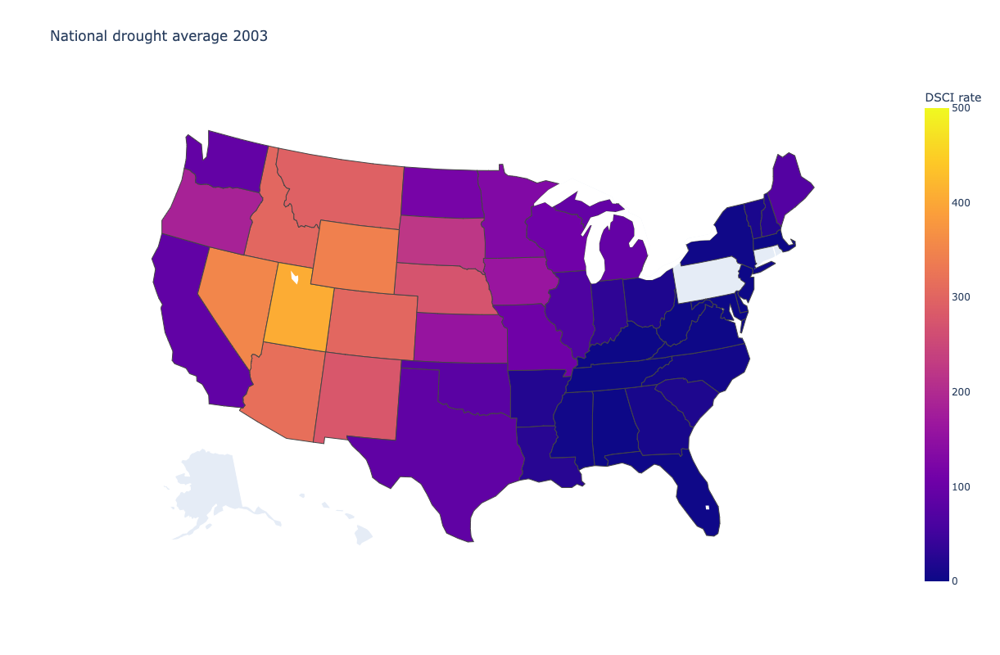

In [42]:
graph_years(2003)

In [44]:
data_2003=data[data['ValidEnd'].between('2003-01-06','2003-12-29')]
data_2020=data[data['ValidEnd'].between('2020-01-06','2020-12-28')]

In [45]:
oregon_2003=data_2003[data_2003['state']=='OR']
oregon_2020=data_2020[data_2020['state']=='OR']

utah_2003=data_2003[data_2003['state']=='UT']
utah_2020=data_2020[data_2020['state']=='UT']

texas_2003=data_2003[data_2003['state']=='TX']
texas_2020=data_2020[data_2020['state']=='TX']

ohio_2003=data_2003[data_2003['state']=='OH']
ohio_2020=data_2020[data_2020['state']=='OH']

oregon_2003.set_index('ValidEnd',inplace=True)
oregon_2020.set_index('ValidEnd',inplace=True)
utah_2003.set_index('ValidEnd',inplace=True)
utah_2020.set_index('ValidEnd',inplace=True)
texas_2003.set_index('ValidEnd',inplace=True)
texas_2020.set_index('ValidEnd',inplace=True)
ohio_2003.set_index('ValidEnd',inplace=True)
ohio_2020.set_index('ValidEnd',inplace=True)

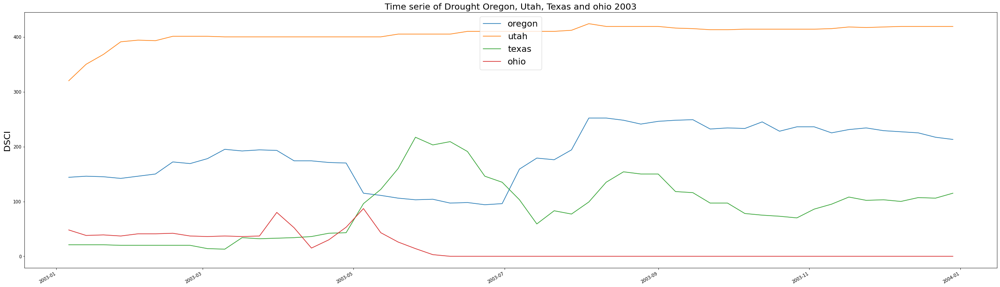

In [46]:
fig, ax = plt.subplots(figsize=(40, 12))

ax.plot(oregon_2003['DSCI'])
ax.plot(utah_2003['DSCI'])
ax.plot(texas_2003['DSCI'])
ax.plot(ohio_2003['DSCI'])

plt.title('Time serie of Drought Oregon, Utah, Texas and ohio 2003',fontdict={'fontsize':20});
plt.ylabel("DSCI",fontdict={'fontsize':20})
plt.legend(['oregon','utah','texas','ohio'],loc='upper center',fontsize=20);
fig.autofmt_xdate()
plt.savefig('../images/time_serie_4_states_2003.png')

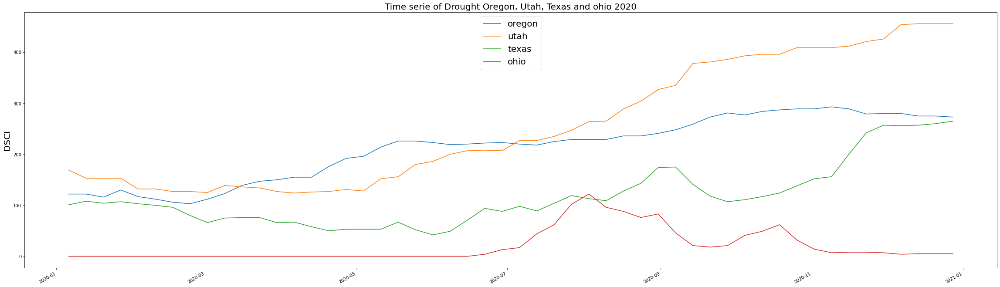

In [49]:
fig, ax = plt.subplots(figsize=(40, 12))

ax.plot(oregon_2020['DSCI'])
ax.plot(utah_2020['DSCI'])
ax.plot(texas_2020['DSCI'])
ax.plot(ohio_2020['DSCI'])

plt.title('Time serie of Drought Oregon, Utah, Texas and ohio 2020',fontdict={'fontsize':20});
plt.ylabel("DSCI",fontdict={'fontsize':20})
plt.legend(['oregon','utah','texas','ohio'],loc='upper center',fontsize=20);
fig.autofmt_xdate()
plt.savefig('../images/time_serie_4_states_2020.png')

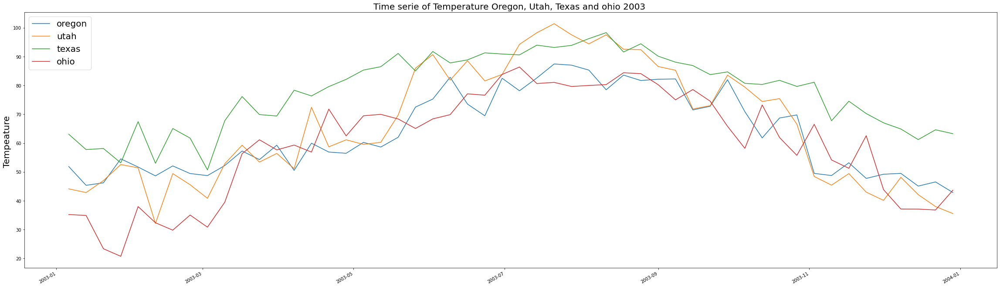

In [50]:
fig, ax = plt.subplots(figsize=(40,12))

ax.plot(oregon_2003['avg_tmax'])
ax.plot(utah_2003['avg_tmax'])
ax.plot(texas_2003['avg_tmax'])
ax.plot(ohio_2003['avg_tmax'])

plt.title('Time serie of Temperature Oregon, Utah, Texas and ohio 2003 ',fontdict={'fontsize':20});
plt.ylabel("Tempeature ",fontdict={'fontsize':20})
plt.legend(['oregon','utah','texas','ohio'],loc='upper left',fontsize=20);
fig.autofmt_xdate()
plt.savefig('../images/time_serie_temp_4_states_2003.png')

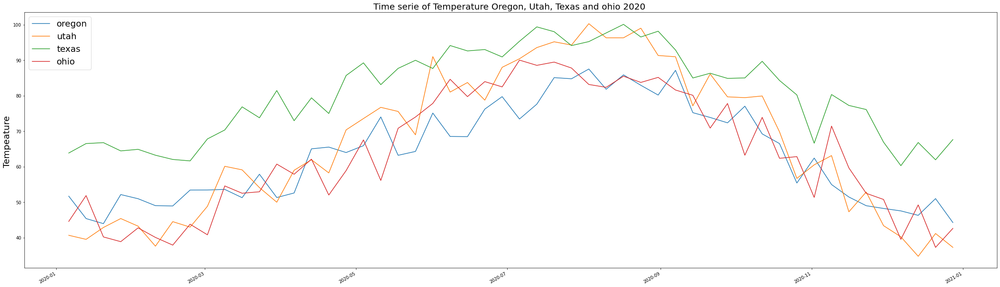

In [51]:
fig, ax = plt.subplots(figsize=(40,12))

ax.plot(oregon_2020['avg_tmax'])
ax.plot(utah_2020['avg_tmax'])
ax.plot(texas_2020['avg_tmax'])
ax.plot(ohio_2020['avg_tmax'])

plt.title('Time serie of Temperature Oregon, Utah, Texas and ohio 2020 ',fontdict={'fontsize':20});
plt.ylabel("Tempeature ",fontdict={'fontsize':20})
plt.legend(['oregon','utah','texas','ohio'],loc='upper left',fontsize=20);
fig.autofmt_xdate()
plt.savefig('../images/time_serie_temp_4_states_20202.png')

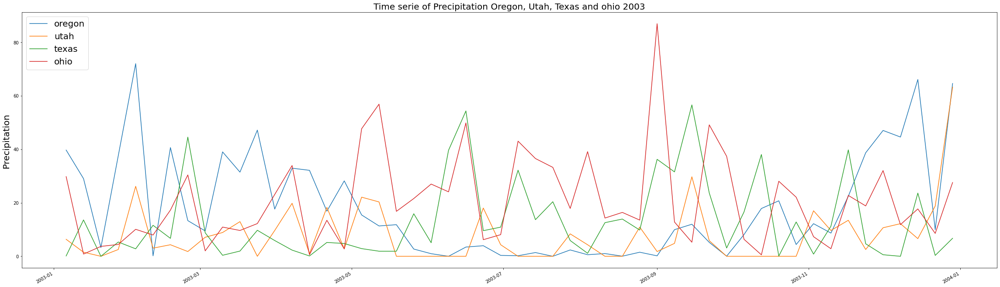

In [52]:
fig, ax = plt.subplots(figsize=(40, 12))

ax.plot(oregon_2003['total_avg_prcp_mm'])
ax.plot(utah_2003['total_avg_prcp_mm'])
ax.plot(texas_2003['total_avg_prcp_mm'])
ax.plot(ohio_2003['total_avg_prcp_mm'])

plt.title('Time serie of Precipitation Oregon, Utah, Texas and ohio 2003',fontdict={'fontsize':20});
plt.ylabel("Precipitation ",fontdict={'fontsize':20})
plt.legend(['oregon','utah','texas','ohio'],loc='upper left',fontsize=20);
fig.autofmt_xdate()
plt.savefig('../images/time_serie_precip_4_states_2003.png')

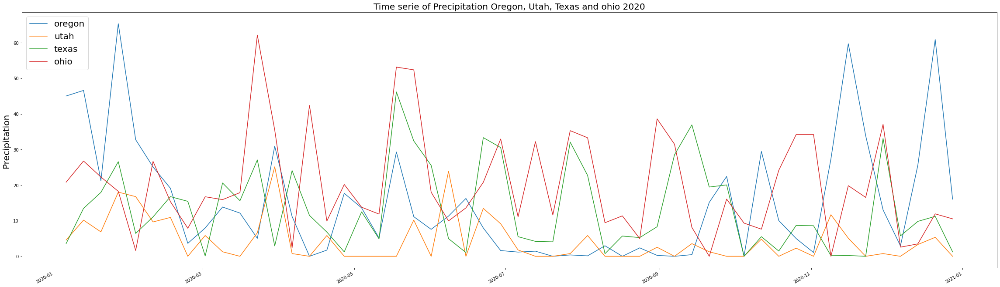

In [53]:
fig, ax = plt.subplots(figsize=(40, 12))

ax.plot(oregon_2020['total_avg_prcp_mm'])
ax.plot(utah_2020['total_avg_prcp_mm'])
ax.plot(texas_2020['total_avg_prcp_mm'])
ax.plot(ohio_2020['total_avg_prcp_mm'])

plt.title('Time serie of Precipitation Oregon, Utah, Texas and ohio 2020',fontdict={'fontsize':20});
plt.ylabel("Precipitation ",fontdict={'fontsize':20})
plt.legend(['oregon','utah','texas','ohio'],loc='upper left',fontsize=20);
fig.autofmt_xdate()
plt.savefig('../images/time_serie_precip_4_states_2020.png')

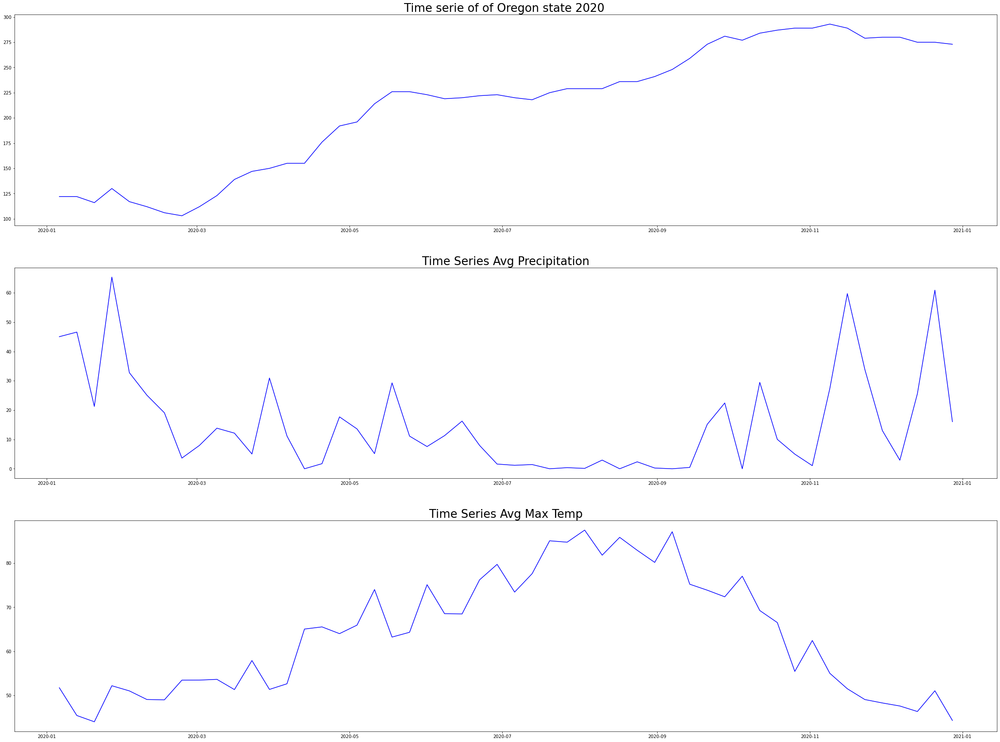

In [55]:
fig, (ax1,ax2,ax3) = plt.subplots(3,figsize=(40, 30))
ax1.plot(oregon_2020['DSCI'],color='b')
ax1.set_title('Time serie of of Oregon state 2020 ',fontdict={'fontsize':26});
ax2.plot(oregon_2020['total_avg_prcp_mm'],color='b')
ax2.set_title('Time Series Avg Precipitation',fontdict={'fontsize':26});
ax3.plot(oregon_2020['avg_tmax'],color='b')
ax3.set_title('Time Series Avg Max Temp',fontdict={'fontsize':26});
plt.savefig('../images/time_serie_oregon_2020_3 graphs.png')

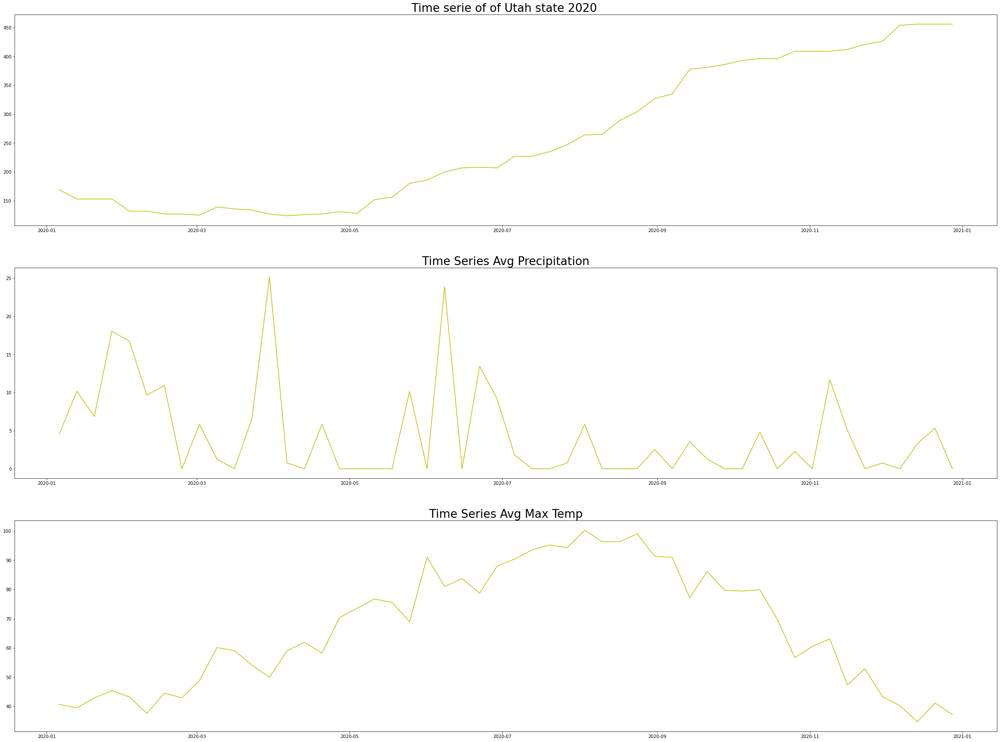

In [56]:
fig, (ax1,ax2,ax3) = plt.subplots(3,figsize=(40, 30))
ax1.plot(utah_2020['DSCI'],color='y')
ax1.set_title('Time serie of of Utah state 2020 ',fontdict={'fontsize':26});
ax2.plot(utah_2020['total_avg_prcp_mm'],color='y')
ax2.set_title('Time Series Avg Precipitation',fontdict={'fontsize':26});
ax3.plot(utah_2020['avg_tmax'],color='y')
ax3.set_title('Time Series Avg Max Temp',fontdict={'fontsize':26});
plt.savefig('../images/time_serie_utah_2020_3 graphs.png')

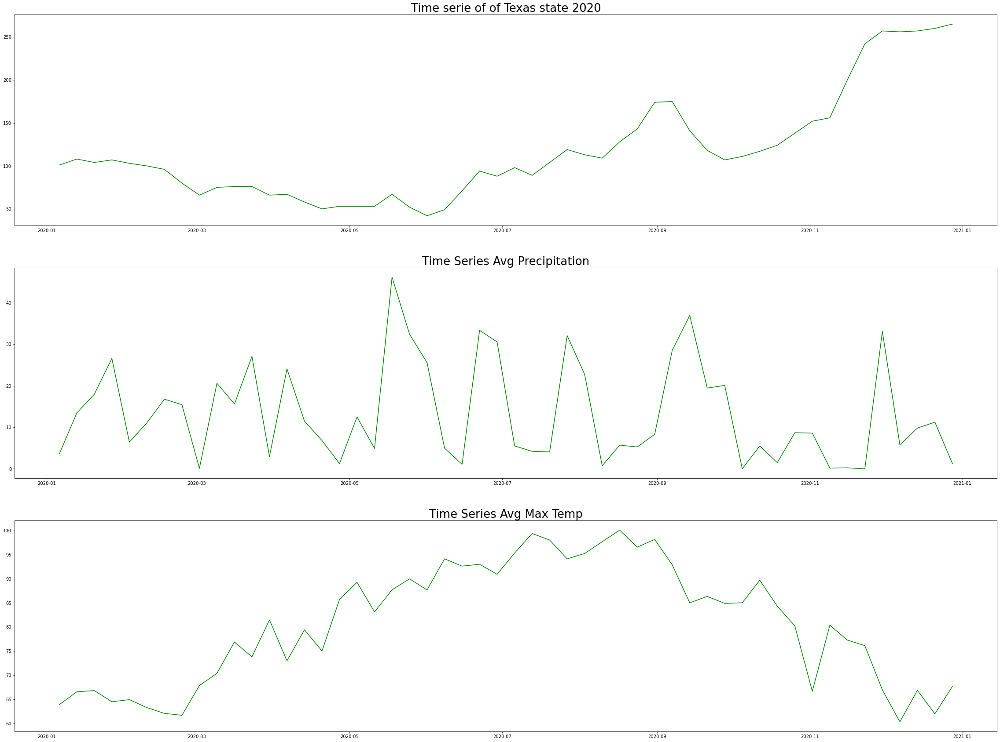

In [57]:
fig, (ax1,ax2,ax3) = plt.subplots(3,figsize=(40, 30))
ax1.plot(texas_2020['DSCI'],color='g')
ax1.set_title('Time serie of of Texas state 2020',fontdict={'fontsize':26});
ax2.plot(texas_2020['total_avg_prcp_mm'],color='g')
ax2.set_title('Time Series Avg Precipitation',fontdict={'fontsize':26});
ax3.plot(texas_2020['avg_tmax'],color='g')
ax3.set_title('Time Series Avg Max Temp',fontdict={'fontsize':26});
plt.savefig('../images/time_serie_textas_2020_3_graphs.png')

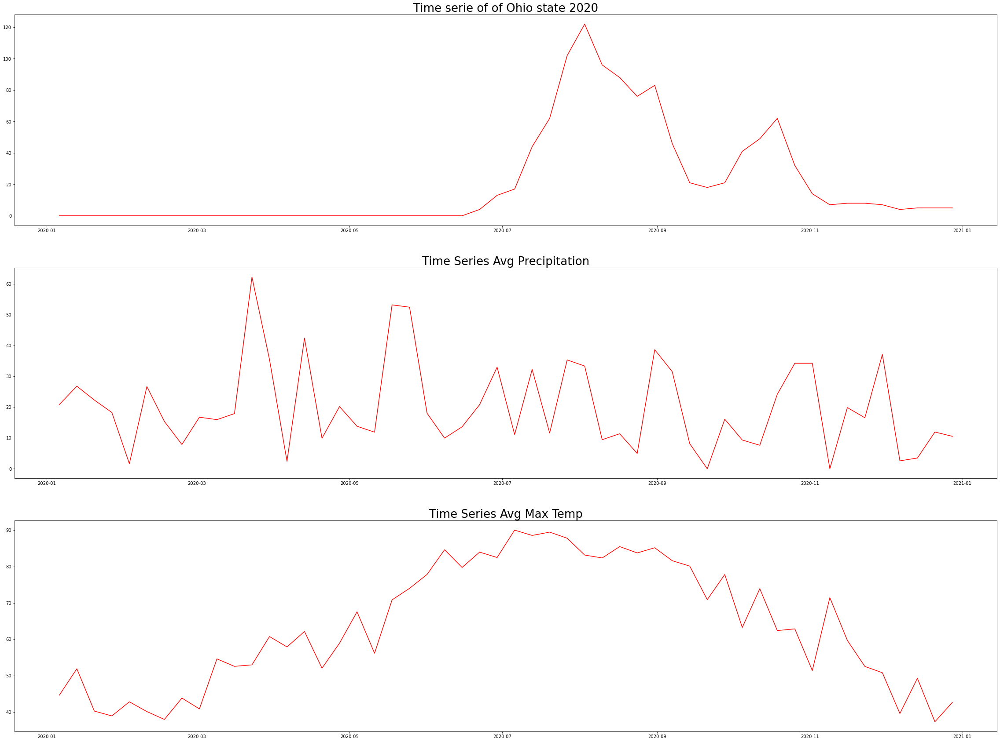

In [58]:
fig, (ax1,ax2,ax3) = plt.subplots(3,figsize=(40, 30))
ax1.plot(ohio_2020['DSCI'],color='r')
ax1.set_title('Time serie of of Ohio state 2020',fontdict={'fontsize':26});
ax2.plot(ohio_2020['total_avg_prcp_mm'],color='r')
ax2.set_title('Time Series Avg Precipitation',fontdict={'fontsize':26});
ax3.plot(ohio_2020['avg_tmax'],color='r')
ax3.set_title('Time Series Avg Max Temp',fontdict={'fontsize':26});
plt.savefig('../images/time_serie_ohio_2020_3_graphs.png')